**This notebook trains and evaluates the baseline model**

In [1]:
%env CUDA_DEVICE_ORDER=PCI_BUS_ID
%env CUDA_VISIBLE_DEVICES=0

env: CUDA_DEVICE_ORDER=PCI_BUS_ID
env: CUDA_VISIBLE_DEVICES=0


In [2]:
import numpy as np
import pandas as pd
import os
from tqdm import tqdm_notebook
import sys
from sklearn.metrics import roc_auc_score
import cv2
import albumentations
from fastai import *
from fastai.vision import *
from fastai.vision import models
from fastai.callbacks import SaveModelCallback

from fastai.torch_core import flatten_model
from torchvision.models import *
import pretrainedmodels

In [3]:
# cadene models
pretrainedmodels.model_names

['fbresnet152',
 'bninception',
 'resnext101_32x4d',
 'resnext101_64x4d',
 'inceptionv4',
 'inceptionresnetv2',
 'alexnet',
 'densenet121',
 'densenet169',
 'densenet201',
 'densenet161',
 'resnet18',
 'resnet34',
 'resnet50',
 'resnet101',
 'resnet152',
 'inceptionv3',
 'squeezenet1_0',
 'squeezenet1_1',
 'vgg11',
 'vgg11_bn',
 'vgg13',
 'vgg13_bn',
 'vgg16',
 'vgg16_bn',
 'vgg19_bn',
 'vgg19',
 'nasnetamobile',
 'nasnetalarge',
 'dpn68',
 'dpn68b',
 'dpn92',
 'dpn98',
 'dpn131',
 'dpn107',
 'xception',
 'senet154',
 'se_resnet50',
 'se_resnet101',
 'se_resnet152',
 'se_resnext50_32x4d',
 'se_resnext101_32x4d',
 'cafferesnet101',
 'pnasnet5large',
 'polynet']

In [4]:
def arch_summary(arch):
    model = arch(False)
    tot = 0
    for i, l in enumerate(model.children()):
        n_layers = len(flatten_model(l))
        tot += n_layers
        print(f'({i}) {l.__class__.__name__:<12}: {n_layers:<4}layers (total: {tot})')

def get_groups(model, layer_groups):
    group_indices = [len(g) for g in layer_groups]
    curr_i = 0
    group = []
    for layer in model:
        group_indices[curr_i] -= len(flatten_model(layer))
        group.append(layer.__class__.__name__)
        if group_indices[curr_i] == 0:
            curr_i += 1
            print(f'Group {curr_i}:', group)   
            group = []
        
class FakeData:
    def __init__(self):
        self.c = 2
        self.path = ''    
        self.device = None
        self.loss_func = CrossEntropyFlat(axis=1)

In [5]:
# we wrap cadene model to pytorch models format
def se_resnext101_32x4d(pretrained=True):
    pretrained = 'imagenet' if pretrained else None
    model = pretrainedmodels.__dict__['se_resnext101_32x4d'](pretrained=pretrained)
    all_layers = list(model.children())
    return nn.Sequential(*all_layers)

In [6]:
arch_summary(se_resnext101_32x4d)

(0) Sequential  : 4   layers (total: 4)
(1) Sequential  : 38  layers (total: 42)
(2) Sequential  : 50  layers (total: 92)
(3) Sequential  : 278 layers (total: 370)
(4) Sequential  : 38  layers (total: 408)
(5) AvgPool2d   : 1   layers (total: 409)
(6) Linear      : 1   layers (total: 410)


Training parameters

In [7]:
BATCH_SIZE = 64
sz = 256
NUM_WORKERS = 16
model_name = '20190807-13-se_resnext101_32x4d_norm_Test'

Use data augmentations that mimic the hue and color saturation variance caused by the different scanning instruments and staining procedures.

In [8]:
albumentations_transform = albumentations.Compose([
    albumentations.RandomRotate90(p=0.5),
    albumentations.Transpose(p=0.5),
    albumentations.Flip(p=0.5),
    albumentations.OneOf([
        albumentations.RandomBrightnessContrast(brightness_limit=0.25, contrast_limit=0.25),
        albumentations.RandomBrightnessContrast(brightness_limit=0.1, contrast_limit=0.1),
    ],p=0.8),
    albumentations.GaussNoise(p=0.05),
    albumentations.augmentations.transforms.HueSaturationValue(hue_shift_limit=15, sat_shift_limit=20, val_shift_limit=20, always_apply=False, p=0.5),
    albumentations.RandomGamma(gamma_limit=(80, 200), always_apply=True, p=1),
])

albumentations_transform_validation = albumentations.Compose([
    #albumentations.RandomRotate90(p=0.5),
    #albumentations.Transpose(p=0.5),
])

### Show training augmentations

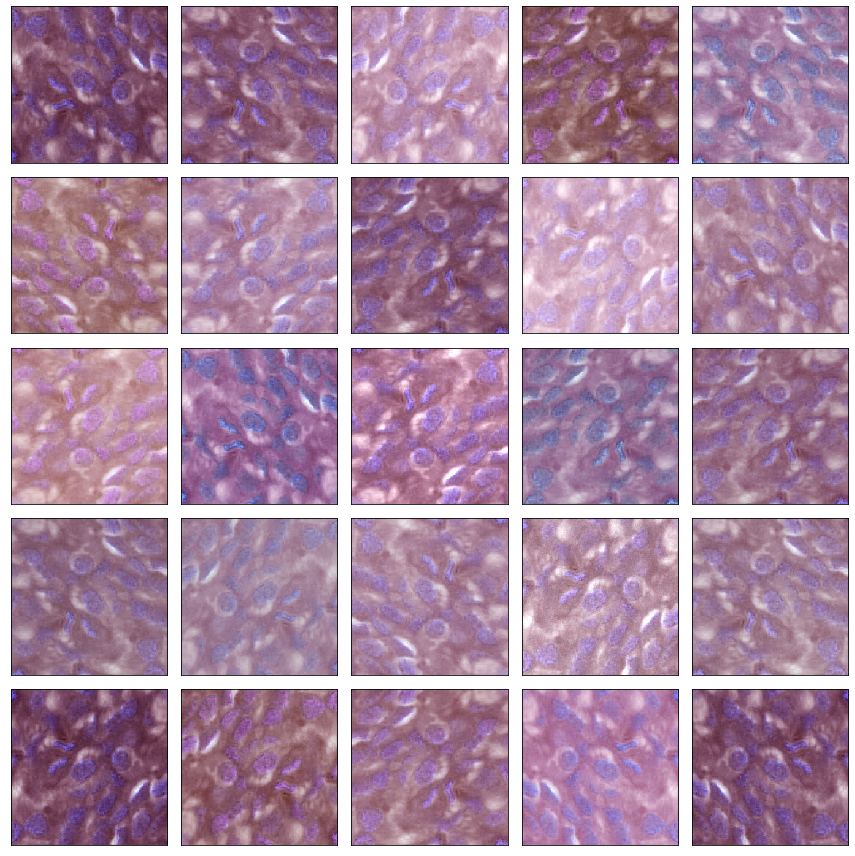

In [9]:
# sample image
img = cv2.imread('data/norm_patches/73001638400004608_0.png')

fig, ax = plt.subplots(5,5, figsize=(12,12))
for i in range(5):
    for j in range(5):
        augmented = albumentations_transform(image=img)
        ax[i,j].imshow(augmented['image'])
        ax[j, i].xaxis.set_major_locator(plt.NullLocator())
        ax[j, i].yaxis.set_major_locator(plt.NullLocator())
plt.tight_layout()

Create a func for returning dataframes with a correct validation fold

In [11]:
def loadDfForFold(fold_index = 0):
    #assert ((fold_index >= 0) and (fold_index <= 3)), "fold index must be between 0 and 3"
    df = pd.read_csv('data/training/train_val.csv').set_index('Unnamed: 0').set_index('patchId',drop=False)
    df['is_valid'] = False
    df_test = pd.read_csv('data/training/test.csv').set_index('Unnamed: 0').set_index('patchId',drop=False)
    df_test['is_valid'] = True
    return pd.concat([df,df_test])

Custom image lists

In [12]:
class CustomImageList(ItemList):
    "`ItemList` suitable for computer vision that uses augmentations for training items but not for validation items"
    _bunch,_square_show,_square_show_res = ImageDataBunch,True,True
    def __init__(self, *args, df_copy=None, validation_colname="", data_dir='',data_suffix='', convert_mode='RGB', after_open:Callable=None, **kwargs):
        super().__init__(*args, **kwargs)
        self.df_copy,self.validation_colname,self.data_dir,self.data_suffix, self.convert_mode,self.after_open = df_copy,validation_colname,data_dir,data_suffix,convert_mode,after_open
        if(df_copy is None):
            print('Empty df copy')
        self.copy_new.append('df_copy')
        self.copy_new.append('validation_colname')
        self.copy_new.append('data_dir')
        self.copy_new.append('data_suffix')
        self.copy_new.append('convert_mode')
        self.c,self.sizes = 3,{}

    def get(self, i):
        fn = super().get(i)
        res = self.open(fn)
        self.sizes[i] = res.size
        return res
    
    def open(self, fn)->Image:
        img = cv2.imread(fn)
        # Apply transformations
        augmented = albumentations_transform_validation(image=img) if (self.df_copy.loc[int(fn.strip(self.data_dir).replace(self.data_suffix, ''))][self.validation_colname]).any() else albumentations_transform(image=img)
        # Convert numpy array to tensor
        return vision.Image(px=pil2tensor(augmented['image']/255., np.float32))
    
    @classmethod
    def from_df_custom(cls, df:DataFrame, path:PathOrStr, cols:IntsOrStrs=0, folder:PathOrStr=None, suffix:str='', **kwargs)->'ItemList':
        "Get the filenames in `cols` of `df` with `folder` in front of them, `suffix` at the end."
        suffix = suffix or ''
        res = super().from_df(df, path=path, cols=cols, **kwargs, data_dir=path, data_suffix=suffix)
        pref = f'{res.path}{os.path.sep}'
        if folder is not None: pref += f'{folder}{os.path.sep}'
        res.items = np.char.add(np.char.add(pref, res.items.astype(str)), suffix)
        return res
    
    def reconstruct(self, t:Tensor): return Image(t.float().clamp(min=0,max=1))

    def show_xys(self, xs, ys, imgsize:int=4, figsize:Optional[Tuple[int,int]]=None, **kwargs):
        "Show the `xs` (inputs) and `ys` (targets) on a figure of `figsize`."
        rows = int(np.ceil(math.sqrt(len(xs))))
        axs = subplots(rows, rows, imgsize=imgsize, figsize=figsize)
        for x,y,ax in zip(xs, ys, axs.flatten()): x.show(ax=ax, y=y, **kwargs)
        for ax in axs.flatten()[len(xs):]: ax.axis('off')
        plt.tight_layout()

    def show_xyzs(self, xs, ys, zs, imgsize:int=4, figsize:Optional[Tuple[int,int]]=None, **kwargs):
        "Show `xs` (inputs), `ys` (targets) and `zs` (predictions) on a figure of `figsize`."
        if self._square_show_res:
            title = 'Ground truth\nPredictions'
            rows = int(np.ceil(math.sqrt(len(xs))))
            axs = subplots(rows, rows, imgsize=imgsize, figsize=figsize, title=title, weight='bold', size=12)
            for x,y,z,ax in zip(xs,ys,zs,axs.flatten()): x.show(ax=ax, title=f'{str(y)}\n{str(z)}', **kwargs)
            for ax in axs.flatten()[len(xs):]: ax.axis('off')
        else:
            title = 'Ground truth/Predictions'
            axs = subplots(len(xs), 2, imgsize=imgsize, figsize=figsize, title=title, weight='bold', size=14)
            for i,(x,y,z) in enumerate(zip(xs,ys,zs)):
                x.show(ax=axs[i,0], y=y, **kwargs)
                x.show(ax=axs[i,1], y=z, **kwargs)

In [13]:
def getDataBunch(fold_index = 0):
    df = loadDfForFold(fold_index)
    # Create ImageDataBunch using fastai data block API
    return (CustomImageList.from_df_custom(path='data/norm_patches/',
                                            df=df,
                                            suffix='_0.png', 
                                            df_copy=df, 
                                            validation_colname='is_valid')
                    .split_from_df('is_valid')
                    #How to split in train/valid? CV index
                    .label_from_df(cols='tumorLabel')
                    #Where are the labels?
                    .transform(tfms=[[],[]], size=sz)
                    # We have our custom transformations implemented in the image loader but we could apply transformations also here
                    # Even though we don't apply transformations here, we set two empty lists to tfms. Train and Validation augmentations
                    .databunch(bs=BATCH_SIZE, num_workers=NUM_WORKERS)
                    # convert to databunch
                    .normalize(imagenet_stats))

**Plot samples from train and valid. sets for sanity check**

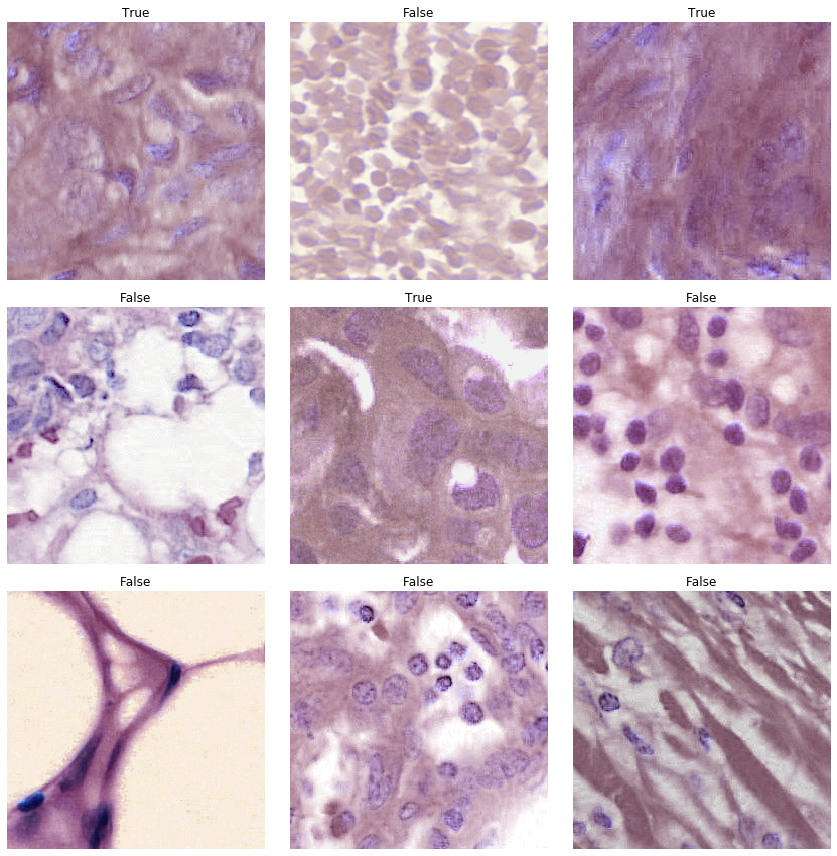

In [14]:
fold_0_databunch = getDataBunch(fold_index=0)
fold_0_databunch.show_batch(rows=3, ds_type=DatasetType.Train)

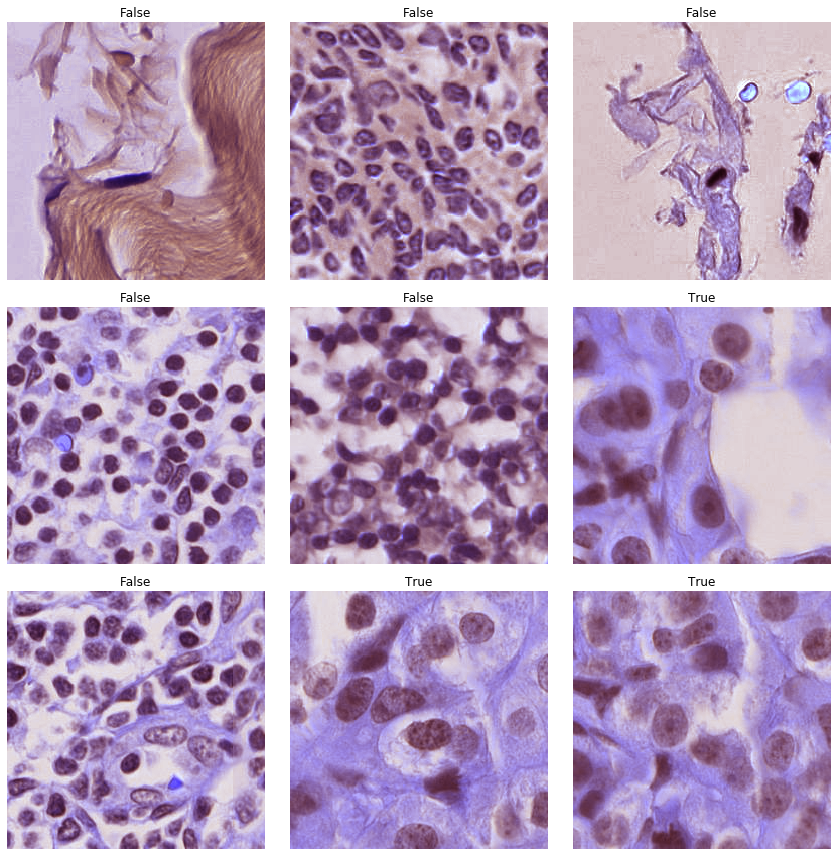

In [15]:
fold_0_databunch.show_batch(rows=3, ds_type=DatasetType.Valid)

### Training

In [16]:
def getLearner(dataBunch):
    learner =  cnn_learner(dataBunch,
                           se_resnext101_32x4d,
                           pretrained=True,
                           path='.',
                           metrics=[accuracy],
                           ps=0.9,
                           callback_fns=ShowGraph)

    learner.crit=nn.BCEWithLogitsLoss()
    return learner

In [17]:
from sklearn.metrics import roc_curve, auc

# hyperparameters
head_training_epochs = 1
head_training_lr = 1e-3

#finetune_training_epochs = 2
#finetune_training_lr = 5e-6

# saved for validation
interp_list = []
preds_list = []
y_list = []
loss_list = []
acc_list = []

tpr_list = []
fpr_list = []
roc_auc_list = []

recorder_stage1_list = []
#recorder_stage2_list = []

# Three times the test fold
for fold in range(5):#[0,1,2,3]:
    print("##########################")
    print("Start training Test - " + str(fold))
    print("##########################")
    
    # get fold databunch
    fold_databunch = getDataBunch(fold_index=fold)
    
    # init new learner
    learner = getLearner(fold_databunch)
    
    print("Training stage-1 of  Test -" + str(fold))
    
    # warmup with lr finder
    learner.lr_find()
    # plot lr finder result
    learner.recorder.plot()
    
    learner.fit_one_cycle(head_training_epochs,
                      head_training_lr)
    
    learner.recorder.plot_losses()
    # save stage 1
    learner.save(model_name + '_test' + str(fold) + '_stage-1')
    
    recorder_stage1_list.append(learner.recorder)
    
    #print("Training stage-2 of fold " + str(fold))
    
    # unfreeze and train some more
    #learner.unfreeze()
    
    # warmup with lr finder
    #learner.lr_find()
    # plot lr finder result
    #learner.recorder.plot()
    
    #learner.fit_one_cycle(finetune_training_epochs,
    #                      finetune_training_lr)
    
    #learner.recorder.plot_losses()
    
    # save stage 2
    #learner.save(model_name + '_fold' + str(fold) + '_stage-2')
    
    #recorder_stage2_list.append(learner.recorder)
    
    # get preds for validation 
    preds,y, loss = learner.get_preds(with_loss=True)
    acc = accuracy(preds, y)
    print('The accuracy of the Test {1} model is {0} %.'.format(acc, fold))
    
    interp = ClassificationInterpretation.from_learner(learner)
    
    preds_list.append(preds)
    y_list.append(y)
    loss_list.append(loss)
    acc_list.append(acc)
    interp_list.append(interp)
    
    
    # probs from log preds
    probs = np.exp(preds[:,1])
    # Compute ROC curve
    fpr, tpr, thresholds = roc_curve(y, probs, pos_label=1)
    
    fpr_list.append(fpr)
    tpr_list.append(tpr)

    # Compute ROC area
    roc_auc = auc(fpr, tpr)
    print('ROC area of the Test {1} is {0}'.format(roc_auc, fold))
    
    roc_auc_list.append(roc_auc)

ROC area of the Test 3 is 0.9569529479751961
##########################
Start training Test - 4
##########################
Training stage-1 of  Test -4


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


epoch,train_loss,valid_loss,accuracy,time


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



# Visualization and validation

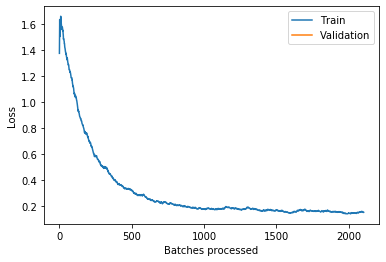

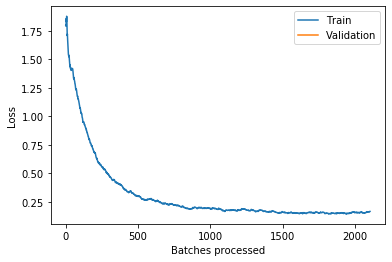

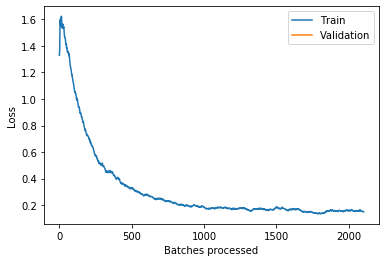

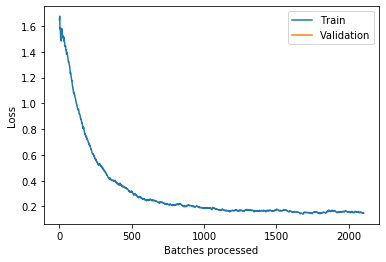

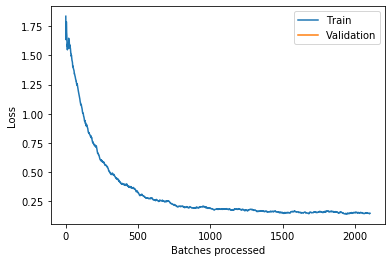

In [18]:
for i, recorder in enumerate(recorder_stage1_list):
    recorder.plot_losses()
    #recorder_stage2_list[i].plot_losses()

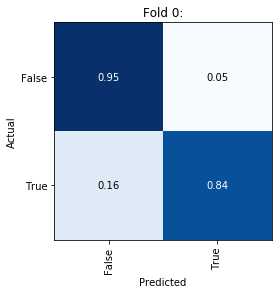

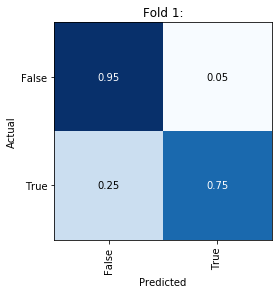

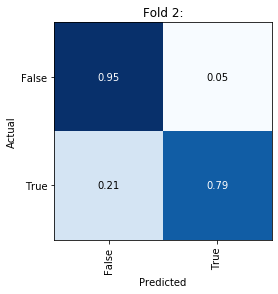

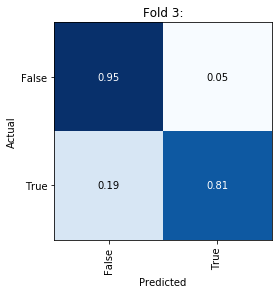

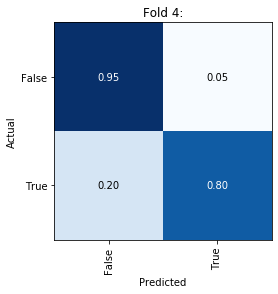

In [19]:
for i, interp in enumerate(interp_list):
    interp.plot_confusion_matrix(normalize=True, title="Fold {0}:".format(i))

In [20]:
for fold , acc in enumerate(acc_list):
    print('The accuracy of the fold {1} model is {0} %.'.format(acc*100, fold))

The accuracy of the fold 0 model is 89.16829681396484 %.
The accuracy of the fold 1 model is 85.33638000488281 %.
The accuracy of the fold 2 model is 87.1325912475586 %.
The accuracy of the fold 3 model is 88.04702758789062 %.
The accuracy of the fold 4 model is 87.37208557128906 %.


In [34]:
for fold , auc in enumerate(roc_auc_list):
    print('The AUC of the test {1} model is {0} %.'.format(auc*100, fold))
print('The average AUC of all test is {0} %'.format(np.asarray(roc_auc_list).mean()*100))
print('The std (ddof=1) of AUC of all tests is {0} %'.format(np.asarray(roc_auc_list).std(ddof=1)*100))

The AUC of the test 0 model is 95.8078985861018 %.
The AUC of the test 1 model is 95.38482793300173 %.
The AUC of the test 2 model is 95.33815006118085 %.
The AUC of the test 3 model is 95.69529479751961 %.
The AUC of the test 4 model is 95.41073374893563 %.
The average AUC of all test is 95.52738102534792 %
The std (ddof=1) of AUC of all tests is 0.21013178353577103 %


In [22]:
from random import randint
def plot_overview(interp:ClassificationInterpretation, classes=['Normal','Tumor'], title_txt=""):
    # top losses will return all validation losses and indexes sorted by the largest first
    tl_val,tl_idx = interp.top_losses()
    #classes = interp.data.classes
    fig, ax = plt.subplots(3,4, figsize=(16,12))
    fig.suptitle('Predicted / Actual / Probability ' + title_txt,fontsize=20)
    # Random
    for i in range(4):
        random_index = randint(0,len(tl_idx))
        idx = tl_idx[random_index]
        im,cl = interp.data.dl(DatasetType.Valid).dataset[idx]
        im = image2np(im.data)
        cl = int(cl)
        ax[0,i].imshow(im)
        ax[0,i].set_xticks([])
        ax[0,i].set_yticks([])
        ax[0,i].set_title(f'{classes[interp.pred_class[idx]]} / {classes[cl]} / {interp.probs[idx][cl]:.2f}')
    ax[0,0].set_ylabel('Random samples', fontsize=16, rotation=0, labelpad=80)
    # Most incorrect or top losses
    for i in range(4):
        idx = tl_idx[i]
        im,cl = interp.data.dl(DatasetType.Valid).dataset[idx]
        cl = int(cl)
        im = image2np(im.data)
        ax[1,i].imshow(im)
        ax[1,i].set_xticks([])
        ax[1,i].set_yticks([])
        ax[1,i].set_title(f'{classes[interp.pred_class[idx]]} / {classes[cl]} / {interp.probs[idx][cl]:.2f}')
    ax[1,0].set_ylabel('Most incorrect\nsamples', fontsize=16, rotation=0, labelpad=80)
    # Most correct or least losses
    for i in range(4):
        idx = tl_idx[len(tl_idx) - i - 1]
        im,cl = interp.data.dl(DatasetType.Valid).dataset[idx]
        cl = int(cl)
        im = image2np(im.data)
        ax[2,i].imshow(im)
        ax[2,i].set_xticks([])
        ax[2,i].set_yticks([])
        ax[2,i].set_title(f'{classes[interp.pred_class[idx]]} / {classes[cl]} / {interp.probs[idx][cl]:.2f}')
    ax[2,0].set_ylabel('Most correct\nsamples', fontsize=16, rotation=0, labelpad=80)

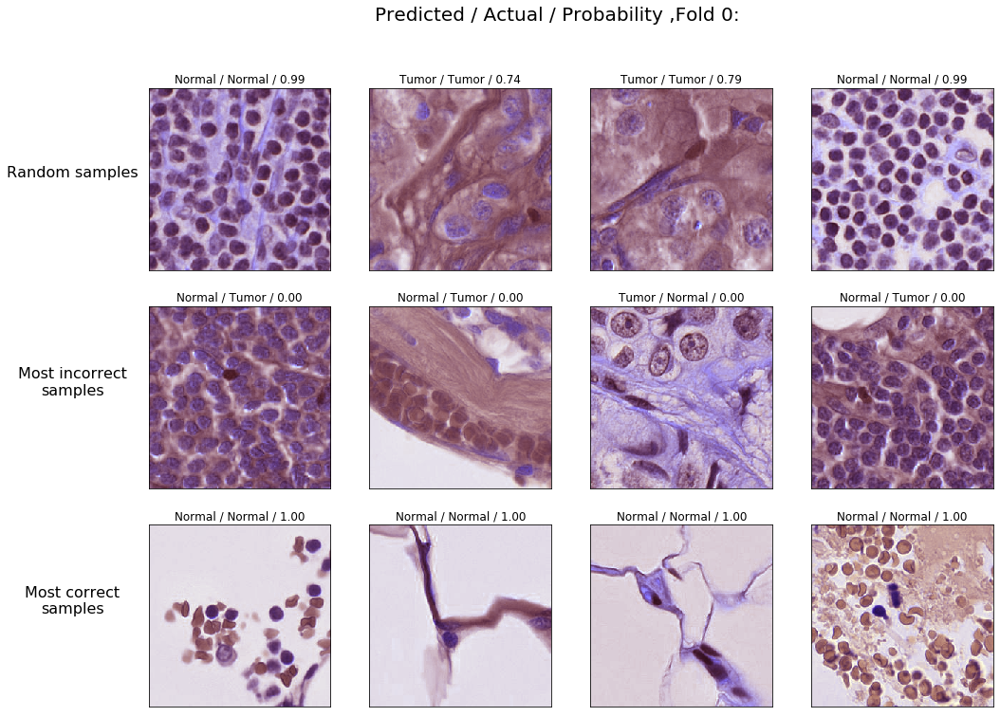

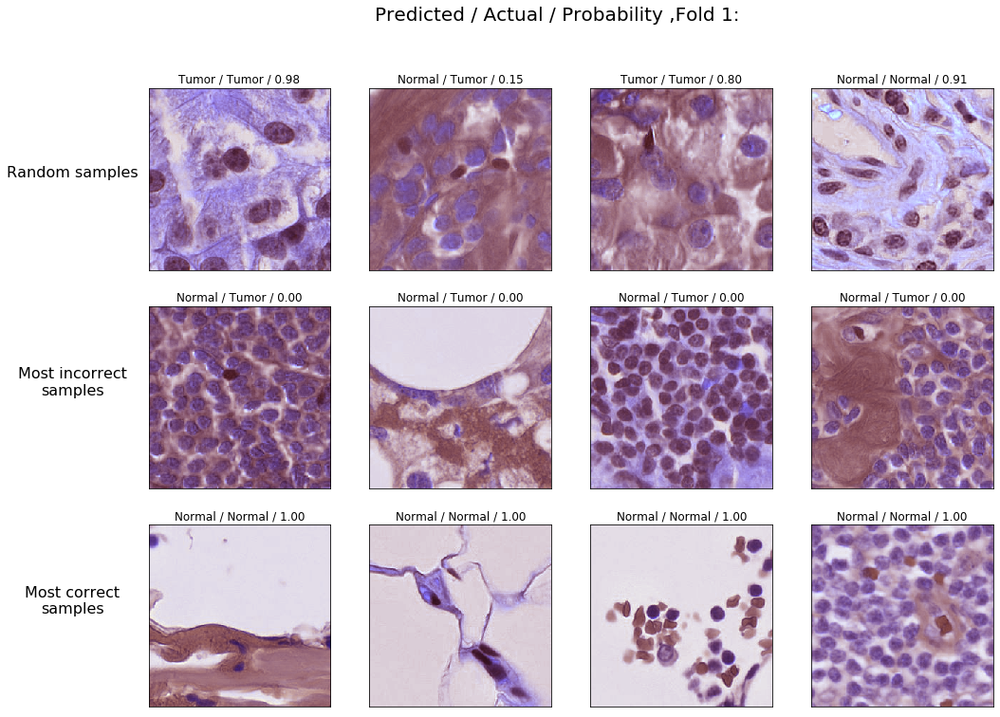

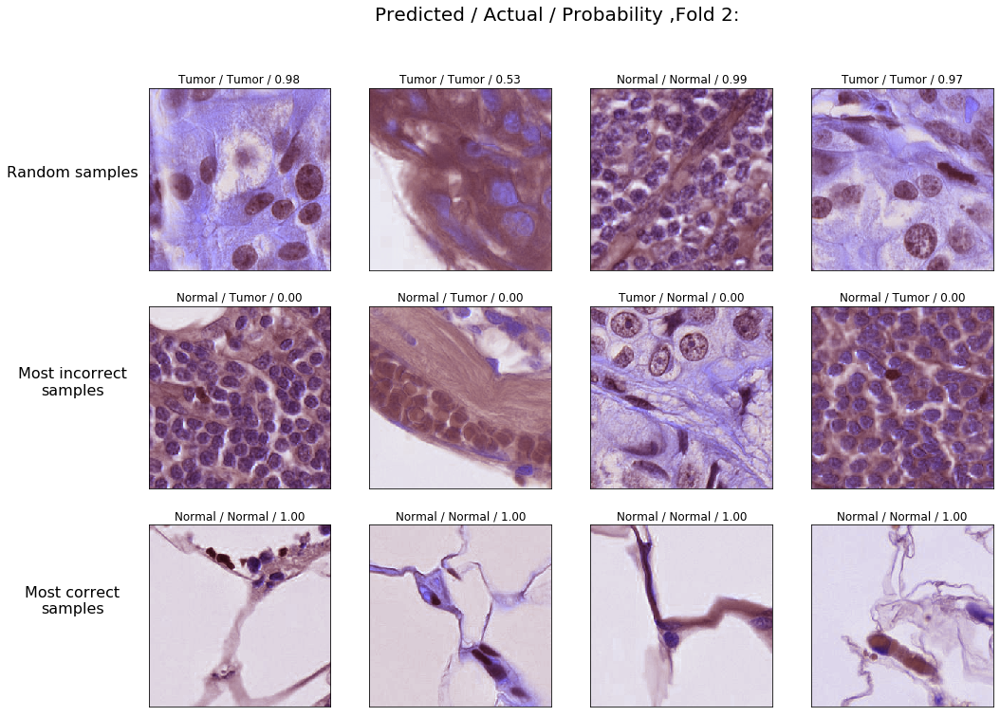

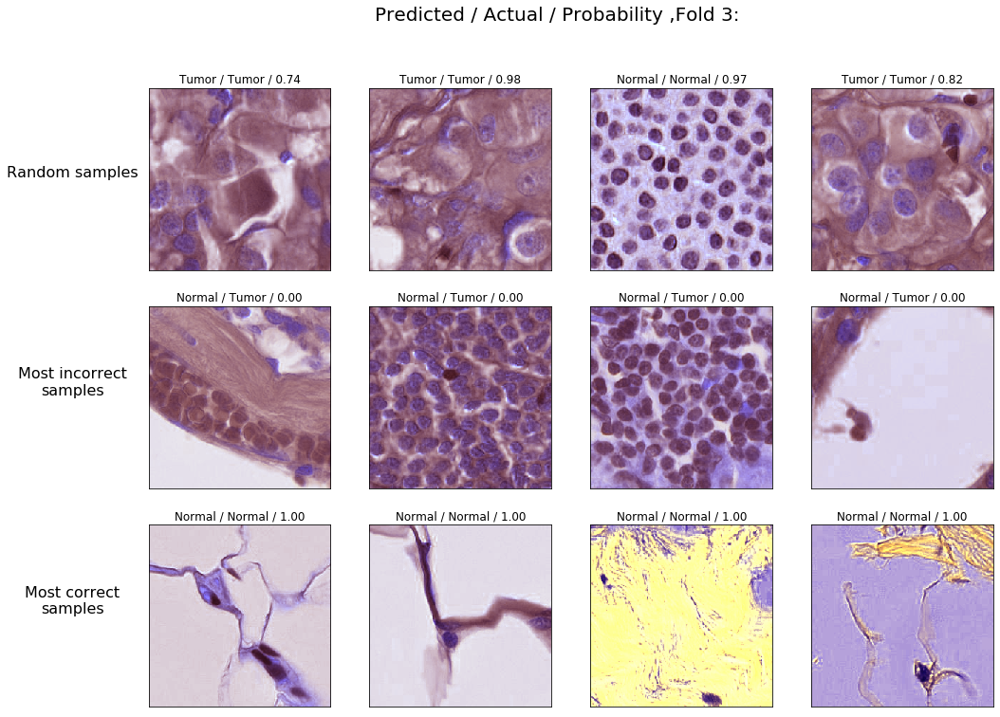

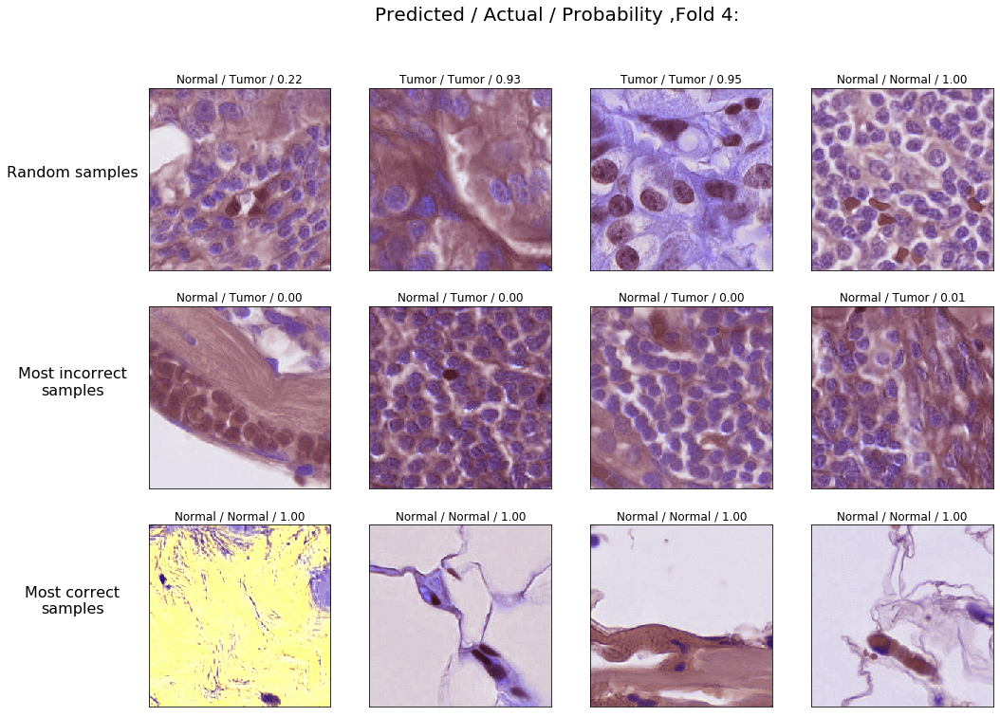

In [23]:
for i, interp in enumerate(interp_list):
    plot_overview(interp, ['Normal','Tumor'], title_txt=",Fold {0}:".format(i))

In [24]:
from fastai.callbacks.hooks import *

# hook into forward pass
def hooked_backward(m, oneBatch, cat, depth=0):
    # we hook into the convolutional part = m[0] of the model
    if (depth == None):
        with hook_output(m[0]) as hook_a: 
            with hook_output(m[0], grad=True) as hook_g:
                preds = m(oneBatch)
                preds[0,int(cat)].backward()
        return hook_a,hook_g
    else:
        with hook_output(m[0][depth]) as hook_a: 
            with hook_output(m[0][depth], grad=True) as hook_g:
                preds = m(oneBatch)
                preds[0,int(cat)].backward()
        return hook_a,hook_g

In [25]:
def colorize_binary_image(img, color_channel:int=1, max_value=1):
    '''
    Colorize binary image to set color channel.
    Only 0 and 1 works with the color channel'''
    empty_c = np.zeros((img.shape[0], img.shape[1], 1), dtype=np.uint8) 
    alpha_c = np.ones((img.shape[0], img.shape[1], 1), dtype=np.uint8)
    sc_factor = 255/5e-6 if max_value < 5e-6 else 255/max_value
    img *= sc_factor
    img = torch.clamp(img, 0, 255, out=None)
    img = img.reshape((img.shape[0], img.shape[1], 1)).numpy().astype(np.uint8)
    alpha_img = np.concatenate([empty_c, img, empty_c, alpha_c], axis=2) if color_channel == 1 else np.concatenate([ img, empty_c, empty_c, alpha_c], axis=2)
    for x in range(img.shape[0]):
        for y in range(img.shape[1]):
            alpha_img[x, y, 3] = 0 if alpha_img[x, y, color_channel] == 0 else alpha_img[x, y, color_channel]*2//3
    return alpha_img

In [26]:
# We can create a utility function for getting a validation image with an activation map
def getHeatmap(val_index, databunch, learner, depth=0, manual_scaler=None):
    """Returns the validation set image and the activation map"""
    # this gets the model
    m = learner.model.eval()
    tensorImg,cl = databunch.valid_ds[val_index]
    # create a batch from the one image
    oneBatch,_ = databunch.one_item(tensorImg)
    oneBatch_im = vision.Image(databunch.denorm(oneBatch)[0])
    # convert batch tensor image to grayscale image with opencv
    cvIm = cv2.cvtColor(image2np(oneBatch_im.data), cv2.COLOR_RGB2GRAY)
    colorImage = image2np(oneBatch_im.data)
    
    # attach hooks
    #hook_a,hook_g = hooked_backward(m, oneBatch, cl)
    hook_a_tumor,hook_g_tumor = hooked_backward(m, oneBatch, 1, depth)
    # get convolutional activations and average from channels
    acts_tumor = hook_a_tumor.stored[0].cpu()

    # Grad-CAM
    grad_tumor = hook_g_tumor.stored[0][0].cpu()
    grad_chan_tumor = grad_tumor.mean(1).mean(1)
    mult_tumor = F.relu((acts_tumor*grad_chan_tumor[...,None,None]).mean(0))
    
    hook_a_normal,hook_g_normal = hooked_backward(m, oneBatch, 0, depth)
    # get convolutional activations and average from channels
    acts_normal = hook_a_normal.stored[0].cpu()

    # Grad-CAM
    grad_normal = hook_g_normal.stored[0][0].cpu()
    grad_chan_normal = grad_normal.mean(1).mean(1)
    mult_normal = F.relu((acts_normal*grad_chan_normal[...,None,None]).mean(0))
    
    scaler = max(mult_tumor.max(), mult_normal.max())
    if (manual_scaler is not None):
        scaler = manual_scaler
    
    return (colorize_binary_image(mult_tumor, 0, max_value=scaler),
            colorize_binary_image(mult_normal, 1, max_value=scaler),
            colorImage) #cvIm

In [27]:
# Then, modify our plotting func a bit
def plot_heatmap_overview(interp:ClassificationInterpretation, databunch, learner, classes=['Negative','Tumor'], title_txt="", depth=0):
    # top losses will return all validation losses and indexes sorted by the largest first
    tl_val,tl_idx = interp.top_losses()
    #mask_alpha = 0.3
    tissue_alpha = 0.75
    manual_scaler = None# 1e-4
    #classes = interp.data.classes
    fig, ax = plt.subplots(3,4, figsize=(16,13))
    if depth != None:
        fig.suptitle('Layer depth: {0}\nClass activation map where: Green=Normal, Red=Tumor\nPredicted / Actual / Probability '.format(depth) + title_txt,fontsize=20)
    else:
            fig.suptitle('Class activation map where: Green=Normal, Red=Tumor\nPredicted / Actual / Probability ' + title_txt,fontsize=20)    
    # Random
    for i in range(4):
        random_index = randint(0,len(tl_idx))
        idx = tl_idx[random_index]
        act_tumor, act_normal, im = getHeatmap(idx, databunch, learner, depth, manual_scaler)
        H,W = im.shape[:2]
        _,cl = interp.data.dl(DatasetType.Valid).dataset[idx]
        cl = int(cl)
        ax[0,i].imshow(im, alpha=tissue_alpha)
        #ax[0,i].imshow(im, cmap=plt.cm.gray)
        ax[0,i].imshow(act_tumor, extent=(0,H,W,0),
              interpolation='bilinear')
        ax[0,i].imshow(act_normal, extent=(0,H,W,0),
              interpolation='bilinear')
        ax[0,i].set_xticks([])
        ax[0,i].set_yticks([])
        ax[0,i].set_title(f'{classes[interp.pred_class[idx]]} / {classes[cl]} / {interp.probs[idx][cl]:.2f}')
    ax[0,0].set_ylabel('Random samples', fontsize=16, rotation=0, labelpad=80)
    # Most incorrect or top losses
    for i in range(4):
        idx = tl_idx[i]
        act_tumor, act_normal, im = getHeatmap(idx, databunch, learner, depth, manual_scaler)
        H,W = im.shape[:2]
        _,cl = interp.data.dl(DatasetType.Valid).dataset[idx]
        cl = int(cl)
        ax[1,i].imshow(im, alpha=tissue_alpha)
        #ax[1,i].imshow(im, cmap=plt.cm.gray)
        ax[1,i].imshow(act_tumor, extent=(0,H,W,0),
              interpolation='bilinear')
        ax[1,i].imshow(act_normal, extent=(0,H,W,0),
              interpolation='bilinear')
        ax[1,i].set_xticks([])
        ax[1,i].set_yticks([])
        ax[1,i].set_title(f'{classes[interp.pred_class[idx]]} / {classes[cl]} / {interp.probs[idx][cl]:.2f}')
    ax[1,0].set_ylabel('Most incorrect\nsamples', fontsize=16, rotation=0, labelpad=80)
    # Most correct or least losses
    for i in range(4):
        idx = tl_idx[len(tl_idx) - i - 1]
        act_tumor, act_normal, im = getHeatmap(idx, databunch, learner, depth, manual_scaler)
        H,W = im.shape[:2]
        _,cl = interp.data.dl(DatasetType.Valid).dataset[idx]
        cl = int(cl)
        ax[2,i].imshow(im, alpha=tissue_alpha)
        #ax[2,i].imshow(im, cmap=plt.cm.gray)
        ax[2,i].imshow(act_tumor, extent=(0,H,W,0),
              interpolation='bilinear')
        ax[2,i].imshow(act_normal, extent=(0,H,W,0),
              interpolation='bilinear')
        ax[2,i].set_xticks([])
        ax[2,i].set_yticks([])
        ax[2,i].set_title(f'{classes[interp.pred_class[idx]]} / {classes[cl]} / {interp.probs[idx][cl]:.2f}')
    ax[2,0].set_ylabel('Most correct\nsamples', fontsize=16, rotation=0, labelpad=80)

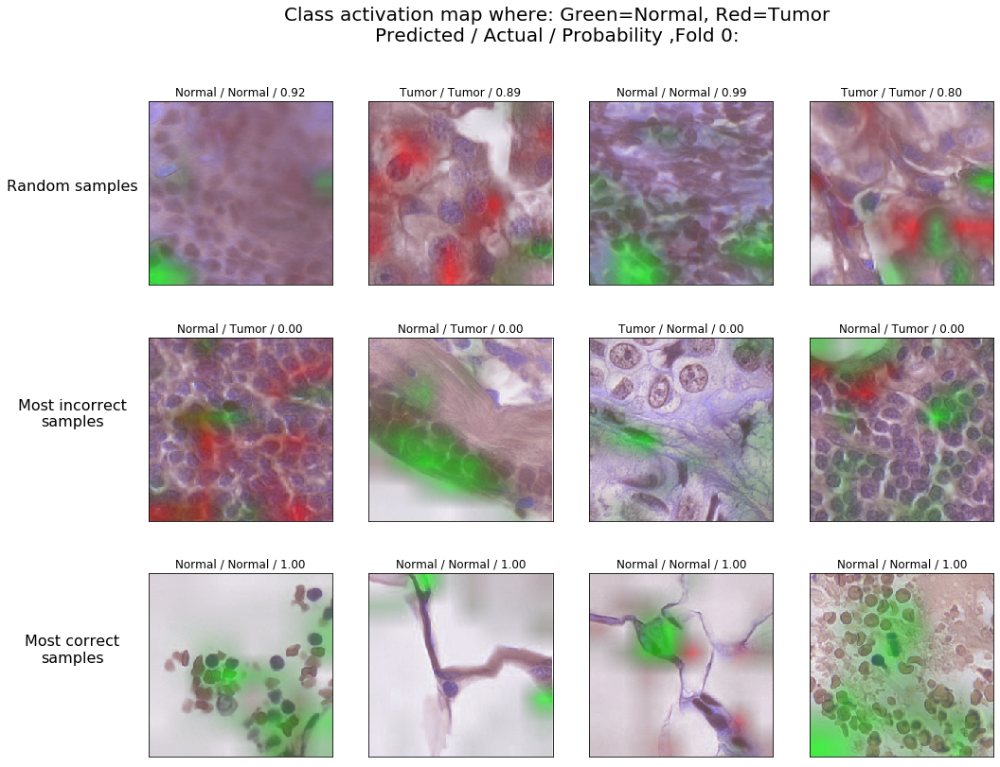

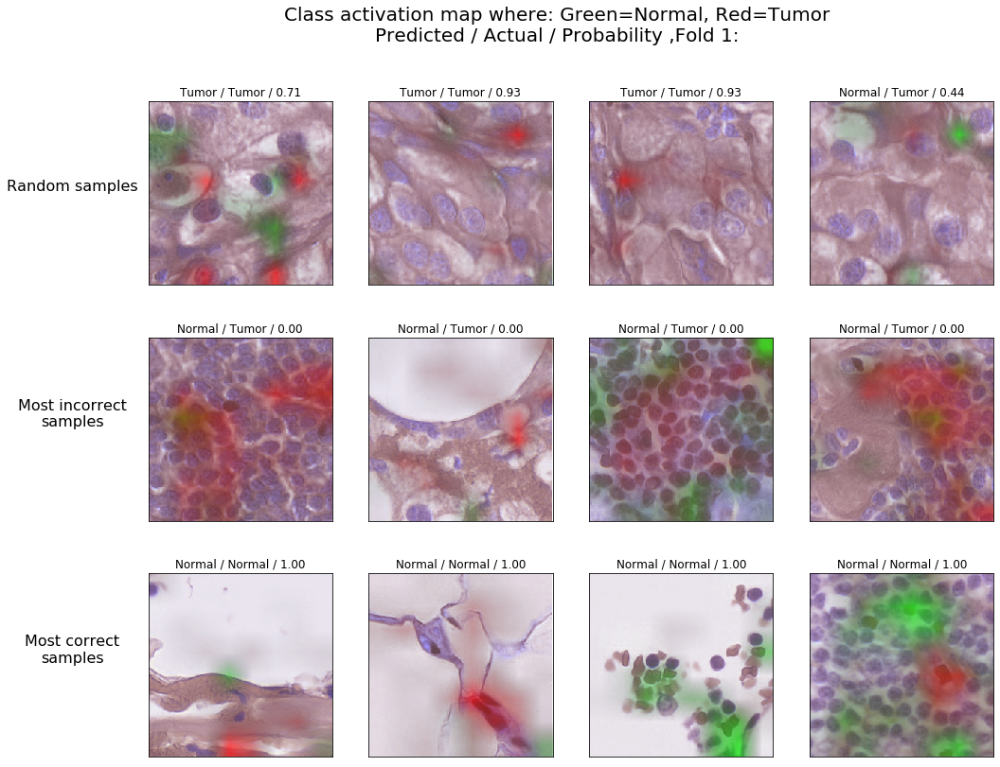

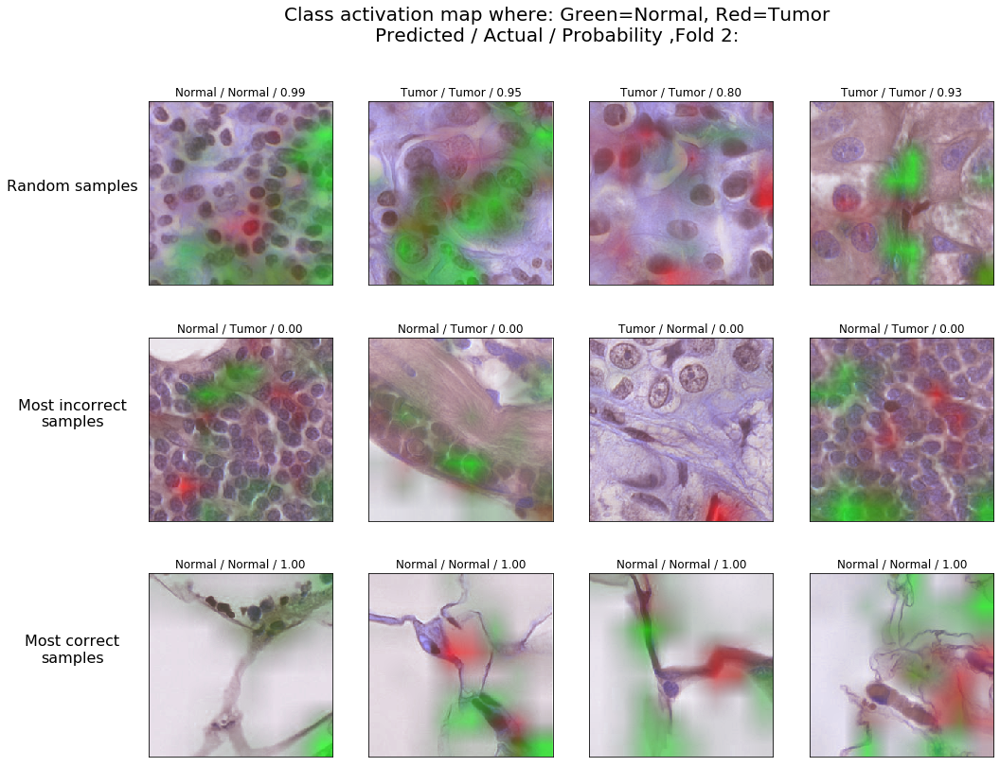

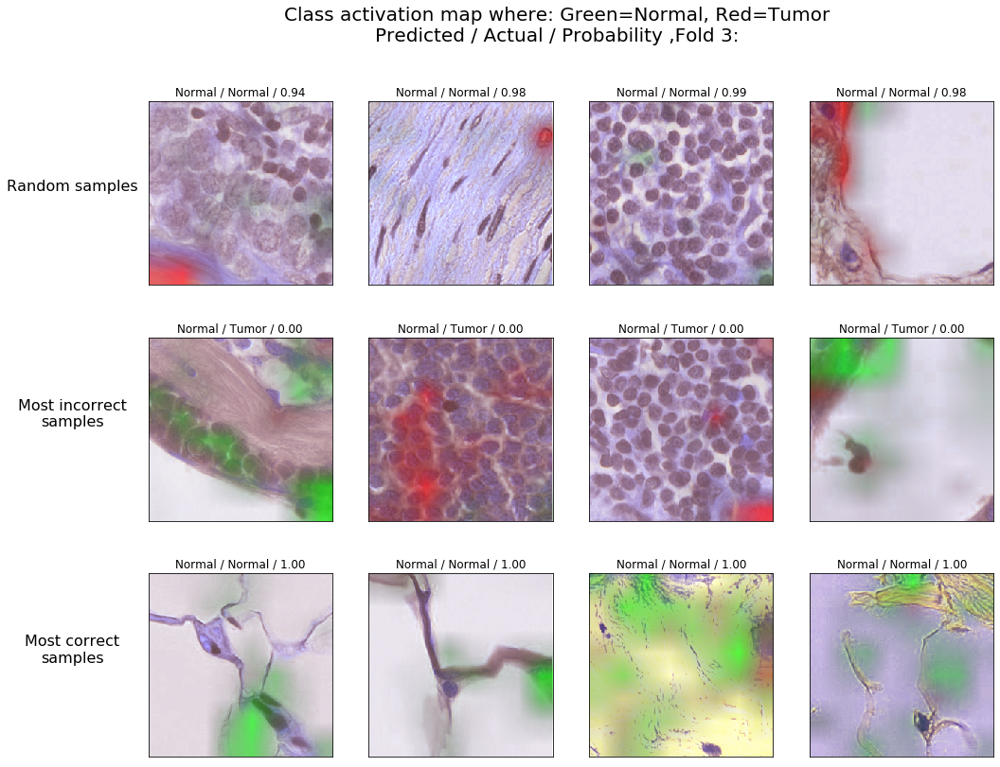

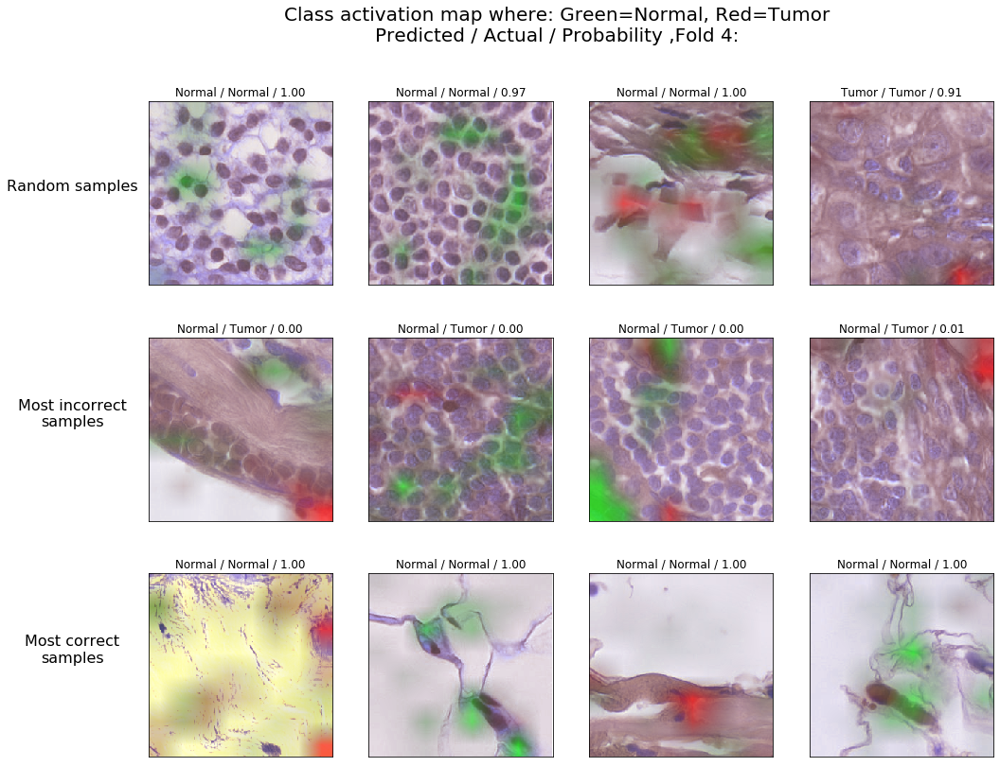

In [28]:
for i, interp in enumerate(interp_list):
    # get fold databunch
    fold_databunch = getDataBunch(fold_index=i)
    
    # init new learner
    learner = getLearner(fold_databunch)
    
    plot_heatmap_overview(interp, fold_databunch, learner, ['Normal','Tumor'], title_txt=",Fold {0}:".format(i), depth=None)

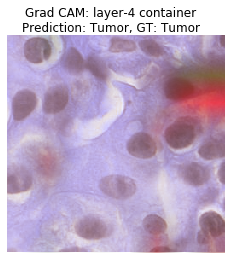

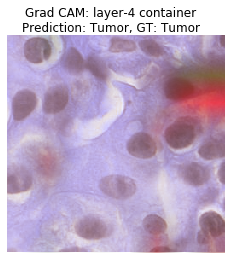

In [29]:
from IPython import display
import time
%matplotlib inline

tissue_alpha = 0.7
classes = ['Normal','Tumor']
manual_scaler = 1e-5

# get fold databunch
fold_databunch = getDataBunch(fold_index=0)
    
# init new learner
learner = getLearner(fold_databunch)

idx = 54
while(idx < 55):
    for d, layer_depth in enumerate([0,1,2,4]):    
        act_tumor, act_normal, im = getHeatmap(idx, fold_databunch, learner ,layer_depth)
        H,W = im.shape[:2]
        
        _,cl = interp.data.dl(DatasetType.Valid).dataset[idx]
        cl = int(cl)

        plt.clf()
        plt.suptitle('Grad CAM: layer-{0} {3}\nPrediction: {1}, GT: {2}'.format(layer_depth,
                                                                                           classes[interp.pred_class[idx]],
                                                                                           classes[cl],
                                                                                            str(type(learner.model.eval()[0][layer_depth])).split('.')[3].strip('\'>')))
        plt.imshow(im, alpha=tissue_alpha)
        plt.imshow(act_tumor, extent=(0,H,W,0),
              interpolation='bilinear')
        plt.imshow(act_normal, extent=(0,H,W,0),
              interpolation='bilinear')

        plt.axis('off')
        #plt.savefig('img/class_activations_1_' + str(d)+'.png')
        #frame update
        display.clear_output(wait=True)
        display.display(plt.gcf())
        time.sleep(1.)
        
    idx += 1

## AUC

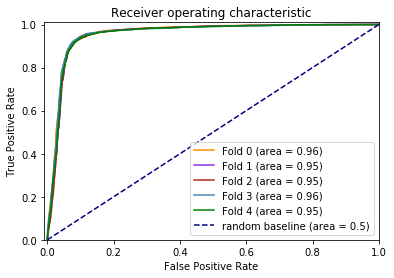

In [33]:
plt.figure()
color_str = ['darkorange', 'blueviolet', 'firebrick', 'steelblue', 'green']
for i, f in enumerate(fpr_list):
    plt.plot(fpr_list[i], tpr_list[i], color=color_str[i], label='Fold %d (area = %0.2f)' % (i, roc_auc_list[i]))
plt.plot([0, 1], [0, 1], color='navy', linestyle='--', label='random baseline (area = 0.5)')
plt.xlim([-0.01, 1.0])
plt.ylim([0.0, 1.01])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")

In [ ]:
learner.model.eval()[0]